In [23]:
# import nltk
# nltk.download('stopwords')
# nltk.download('punkt')

In [24]:

# # COMBINING THE FILES IN ONE FILE TO DEAL WITH IT 
# import pandas as pd

# train_pos = pd.read_csv("data/train_pos.csv", header=None)
# train_neg = pd.read_csv("data/train_neg.csv", header=None)
# test_pos = pd.read_csv("data/test_pos1.csv", header=None)
# test_neg = pd.read_csv("data/test_neg1.csv", header=None)

# data = pd.concat([train_pos, train_neg, test_pos, test_neg])
# data.columns = ['class', 'tweet']
# data.to_csv('dataset.csv', encoding='utf-8', index=False)

In [25]:
import pandas as pd
import numpy as np
data = pd.read_csv('dataset.csv')

# data['label'] = np.where(data['class']=='neg',0,1)
# data.to_csv('dataset.csv', encoding='utf-8', index=False)

data.sample(10)

,class,tweet,label
37065,neg,وإنتي الثانيه چب بعد 😒,0
45516,pos,هذي اللي عارفه لهم صح تحسف انه أقسم 😭😭,1
13071,pos,احلا مافيكم إنكم تدرون ان الهلال مظلوم صح فقرا...,1
48223,pos,كارتير - S.R ❤,1
44906,neg,🌴 فرحين بما آتاهم الله من فضله 🌴 👇👇 لا تعلق سع...,0
20140,pos,💵 مبروك 💪 #حفله_ديانا_حداد_بالكويت,1
2108,pos,التحرر يكون نتيجة إمتزاج حب وعشق وثقة قوية بين...,1
17623,pos,الحمد لله دايم وابدا 💙 فوز مهم جدا 🙏🙏 #الهلال ...,1
18063,pos,#ابوتركي انشهدانك ك…,1
50715,pos,#يسقط_حكم_تميم نصر_اللات المكنى بزميره_ابليس ي...,1


In [26]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords


def tokenize(text):
    return word_tokenize(text)




import re
def remove_emoji(text):
    emoj = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U00002500-\U00002BEF"  # chinese char
        u"\U00002702-\U000027B0"
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"
        u"\u2640-\u2642" 
        u"\u2600-\u2B55"
        u"\u200d"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # dingbats
        u"\u3030"
                      "]+", re.UNICODE)
    return re.sub(emoj, '', text)

# print(remove_emoji("dsdsd 😂😂😂"))

def removeUnnecessarySpaces(text):
    return re.sub(r'[\n\t0-9]+', ' ', text)

def removeNonArabicChar(text):
    return re.sub(r'[^0-9\u0600-\u06ff\u0750-\u077f\ufb50-\ufbc1\ufbd3-\ufd3f\ufd50-\ufd8f\ufd50-\ufd8f\ufe70-\ufefc\uFDF0-\uFDFD.0-9]+', ' ', text)


# def remove_engchars_nums(text):
#     pattern = re.compile(r"[A-Za-z0-9]+")
#     return re.sub(pattern,'', text)


def remove_stop_words(text):
    ar_stop_words = set(stopwords.words('arabic'))
    text = " ".join( [word for word in text if word not in ar_stop_words] )
    return text
print(remove_stop_words(tokenize("يحب الطالب هذا الدكتور")))

يحب الطالب الدكتور


In [27]:
import unicodedata as ud

def remove_punkt(text):
    result = ""
    for word in text:
        for char in word:
            # if the unicodedata for the character is not punctiuation append to string
            if not ud.category(word).startswith('P'):
                result += ''.join(char)
    return result

# test
# print(remove_punkt("هل تريد الذهاب الى الكلية؟؟؟ لاااااا !!"))

In [28]:
# import os 

# def KhojaStemmer(lines):
#     os.chdir("khoja-stemmer-command-line-master")
#     with open('test-in.txt', 'w', encoding='utf-8') as in_file:
#         in_file.writelines(lines)

#     os.system("java -jar khoja-stemmer-command-line.jar test-in.txt test-out.txt")

#     stemmed_lines = ""
#     with open('test-out.txt', 'r', encoding='utf-8') as out_file:
#         for line in out_file.readlines():
#             stemmed_lines += line
#     os.chdir('..')
#     return stemmed_lines

# print(KhojaStemmer("  ذهب عبدالله الى الكليه"))

# import nltk
# def ISRI_Stemmer(txt):
#     st = nltk.ISRIStemmer()
#     tokensText = tokenize(txt)
#     resultStem = ' '.join([st.stem(w) for w in tokensText])
#     return resultStem

# print(ISRI_Stemmer("  ذهب عبدالله الى الكليه"))

  ذهب عبدالله كلأ 

ذهب عبدالل الى كله


In [29]:
def cleaning_pipeline(text):
    text = remove_punkt(text)
    text = remove_emoji(text)
    text = removeNonArabicChar(text)
    text = removeUnnecessarySpaces(text)
    tokens = tokenize(text)
    text = remove_stop_words(tokens)
    return text

data['cleaned_text'] = data['tweet'].apply(cleaning_pipeline)
data.sample(10)

,class,tweet,label,cleaned_text
13733,pos,الحمد لله الذي أنعم علينا بعمر جديد ويوم جديد ...,1,الحمد لله أنعم علينا بعمر جديد ويوم جديد نعيشه...
55634,neg,اللي قبل احلا 🌚,0,اللي احلا
314,pos,أحبها كثر ماهي تستفز .. الغمام وفي كل الاحوال ...,1,أحبها كثر ماهي تستفز الغمام وفي الاحوال لبيها ...
45118,neg,🔱 شکر وتقدير من إدارة 🔱 #مملكة_الطرف_الكحيل_لل...,0,شکر وتقدير إدارة مملكةالطرفالكحيلللدعم الحضور ...
39764,neg,#امطار_الشرقيه 🌺كلين 💪🏼 للتنحيف 🎀 والرشاقة💪🏼 م...,0,امطارالشرقيه كلين للتنحيف والرشاقة متاابعة دور...
8093,pos,نذكر أنفسنا وإياكم بأننا في شهر من الأشهر الحر...,1,نذكر أنفسنا وإياكم بأننا شهر الأشهر الحرم لنتس...
16784,pos,هو حاجة تشبه التارت تهيالي بالكارامل وموز و مك...,1,حاجة تشبه التارت تهيالي بالكارامل وموز مكسرات ...
11138,pos,👋 بنصف ريال تسقي صائما 👇 👇 👇 👇 #الهلال #النصر ...,1,بنصف تسقي صائما الهلال النصر الاهلي الاتحاد يو...
54833,neg,اذا الفيفا عارف هالشي غلط مش المفروض يتصرف ويت...,0,اذا الفيفا عارف هالشي غلط مش المفروض يتصرف ويت...
15772,pos,والله مبادره كويسه 😍,1,والله مبادره كويسه


In [30]:
data.to_csv("cleaned_dataset.csv", index=False, encoding="utf-8")

In [31]:
import pandas as pd
data = pd.read_csv("cleaned_dataset.csv")
data.sample(5)

,class,tweet,label,cleaned_text
51259,neg,لن يهبط الاتحاد حتى لو خسر اليوم ، وأنا متاكد ...,0,يهبط الاتحاد خسر اليوم وأنا متاكد مليون بالمية...
30122,neg,لا ترحل ولا تظن أنني أريد الرحيل فترحل 💔,0,ترحل تظن أنني أريد الرحيل فترحل
7128,pos,متحسبوهاش ، ربنا حساباته احلى .. 💙,1,متحسبوهاش ربنا حساباته احلى
34912,neg,#حسين_عبدالغني لا هو حسين ولا هو غني..🤮 ياكثر ...,0,حسينعبدالغني حسين غني ياكثر ماتحركت يده اليسار...
20463,pos,يمكن هوايتي الوحيده اصور الغيوم بس 💘,1,يمكن هوايتي الوحيده اصور الغيوم


In [32]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import precision_score, recall_score, accuracy_score
from sklearn.ensemble import RandomForestClassifier

X_train, X_test, y_train, y_test = train_test_split(data['cleaned_text'], data['label'], test_size=0.3, stratify=data['label'])


In [56]:
# FIT function only accpets unicode strings hence THE U
TFIDF = TfidfVectorizer(lowercase=False)
X_train_tfidf = TFIDF.fit_transform(X_train.values.astype('U'))
X_test_tfidf = TFIDF.transform(X_test.values.astype('U'))

In [66]:

feature_names = TFIDF.get_feature_names_out()
rows, cols = X_train_tfidf.nonzero()

# SIZE OF THE TFIDF MATRIX IS TO BIG TO BE STORED IN AN ARRAY
for row, col in zip(rows, cols):
    print(feature_names[col], X_train_tfidf[row, col])




# TFIDF.vocabulary_


الخير 0.18960757870954062
السماوات 0.38227462806468854
تلمس 0.4434852366507056
يمكنك 0.4061954579066357
قلبك 0.24311122859718617
وقر 0.41527660799057614
بشئ 0.4061954579066357
فقط 0.24431268703164472
اياه 0.6765959869749099
يخليلك 0.7045929433717459
الله 0.21393142490103517
الكسر 0.33014970608104116
ارحم 0.2984102714750428
التعضيل 0.33342532338361974
بضل 0.3325855361825672
عظم 0.3256156019470944
مو 0.2527194612668538
عضلة 0.33342532338361974
القلب 0.2758545954727571
انو 0.2959945804893903
بنشكر 0.33559041098119907
الله 0.15090503712125997
انت 0.2889274318946537
تأخذك 0.5920938126702652
عادي 0.35860715571856694
حبيبي 0.36048739604610025
تأخذ 0.5544326841517287
تتكرر 0.38201051449991336
عشان 0.19721418342950833
وجه 0.276499761461671
يعطوه 0.40795946645252995
اللاعبين 0.3078489029758567
يطنشه 0.40795946645252995
الملعب 0.29773019950798435
ينزل 0.2958099619756341
اللي 0.16571587067965707
مفروض 0.3278430415294358
يعني 0.19446600019404262
زين 0.2673101939726259
شي 0.18295720394204432
سوا 0.3

In [65]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf_tfidf = rf.fit(X_train_tfidf, y_train)


RANDOM FOREST CLASSIFIER WITH TFIDF

In [58]:
y_pred = rf_tfidf.predict(X_test_tfidf)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
accuracy = accuracy_score(y_test, y_pred)
print('Precision: {} / Recall: {} / Accuracy: {}'.format(round(precision, 3), round(recall, 3), round(accuracy, 3)))

Precision: 0.78 / Recall: 0.774 / Accuracy: 0.777


In [70]:
cleaned = cleaning_pipeline('انا اكره الكلية')
trans = TFIDF.transform([cleaned])
test = rf.predict(trans)[0]
if test == 0:
    print("Negative")
else:
    print("Positive")

Negative


RANDOM FOREST CLASSIFIER WITH COUNT VECTORIZER

In [60]:
from sklearn.feature_extraction.text import CountVectorizer
count_vec = CountVectorizer()
X_train_count =count_vec.fit_transform(X_train.values.astype('U'))
X_test_count = count_vec.transform(X_test.values.astype('U'))

In [41]:
rf_2 = RandomForestClassifier()
count_vec_model = rf_2.fit(X_train_count, y_train)

In [61]:
CountVec_y_pred = count_vec_model.predict(X_test_count)
CountVec_precision = precision_score(y_test, CountVec_y_pred)
CountVec_recall = recall_score(y_test, CountVec_y_pred)
CountVec_accuracy = accuracy_score(y_test, CountVec_y_pred)
print('Precision: {} /n Recall: {} /n Accuracy: {}'.format(round(CountVec_precision, 3), round(CountVec_recall, 3), round(CountVec_accuracy, 3)))



Precision: 0.781 /n Recall: 0.768 /n Accuracy: 0.775


RANDOM FOREST CLASSIFIER WITH COUNT BINARY ENCODING

In [62]:
binary_count_vec=CountVectorizer(binary=True)

X_train_binary_count =binary_count_vec.fit_transform(X_train.values.astype('U'))
X_test_binary_count = binary_count_vec.transform(X_test.values.astype('U'))


In [64]:
rf_3 = RandomForestClassifier()

binary_count_model = rf_3.fit(X_train_binary_count, y_train)

In [73]:
binaryCountVec_y_pred = binary_count_model.predict(X_test_binary_count)
binaryCountVec_precision = precision_score(y_test, binaryCountVec_y_pred)
binaryCountVec_recall = recall_score(y_test, binaryCountVec_y_pred)
binaryCountVec_accuracy = accuracy_score(y_test, binaryCountVec_y_pred)
print('Precision: {} /n Recall: {} /n Accuracy: {}'.format(round(binaryCountVec_precision, 3), round(binaryCountVec_recall, 3),
 round(binaryCountVec_accuracy, 3)))



Precision: 0.53 /n Recall: 0.919 /n Accuracy: 0.55


[0.5495040788778685, 0.7753976172310582, 0.7768061505956922]


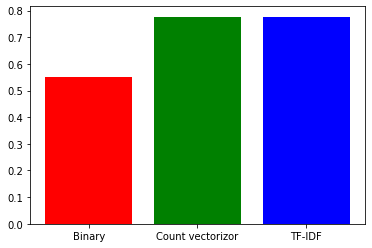

In [78]:
import numpy as np
import matplotlib.pyplot as plt
 
# create a dataset
height = [binaryCountVec_accuracy, CountVec_accuracy, accuracy]
print(height)
bars = ('Binary', 'Count vectorizor', 'TF-IDF')
x_pos = np.arange(len(bars))


# Create bars
plt.bar(x_pos, height = height, color = ['red', 'green','blue'])

# Create names on the x-axis
plt.xticks(x_pos, bars)

# Show graph

plt.show()